<a href="https://colab.research.google.com/github/muppiit/PengolahanCitra_dan_VisiKomputer/blob/main/week3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Praktikum**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Masukkan nilai kecerahan: 50


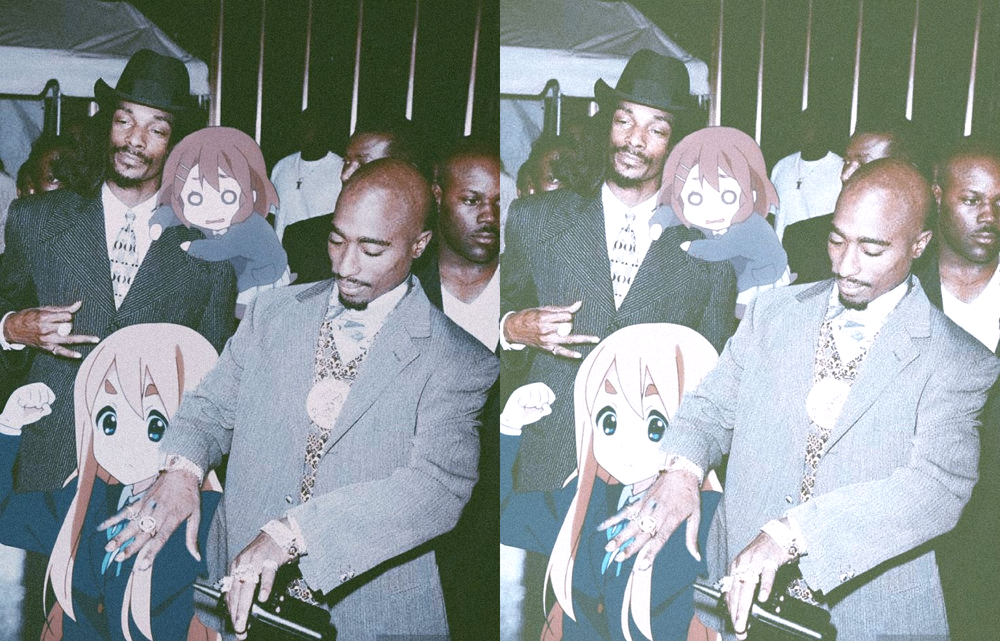

In [ ]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

def adjust_brightness(image_path):
    try:
        brightness = int(input("Masukkan nilai kecerahan: "))
    except ValueError:
        print("Error, input bukan angka.")
        return

    original = cv.imread(image_path)
    if original is None:
        print("Gagal memuat gambar.")
        return

    brightness_image = np.zeros(original.shape, original.dtype)

    for y in range(original.shape[0]):
        for x in range(original.shape[1]):
            for c in range(original.shape[2]):
                brightness_image[y, x, c] = np.clip(original[y, x, c] + brightness, 0, 255)

    brightness_image_simple = cv.convertScaleAbs(original, beta=brightness)

    final_frame = cv.hconcat([original, brightness_image_simple])

    cv2_imshow(final_frame)

adjust_brightness("/content/drive/MyDrive/PCVK/img.jpeg")


#**Tugas**

1. Implementasikan inverse citra pada Google Colaboratory menggunakan formula yang terdapat pada bagian Ulasan Teori, sehingga menghasilkan keluaran seperti berikut:


Masukkan tingkat kecerahan [-255 hingga 255]: 255
Masukkan kontras [1.0 hingga 3.0]: -1


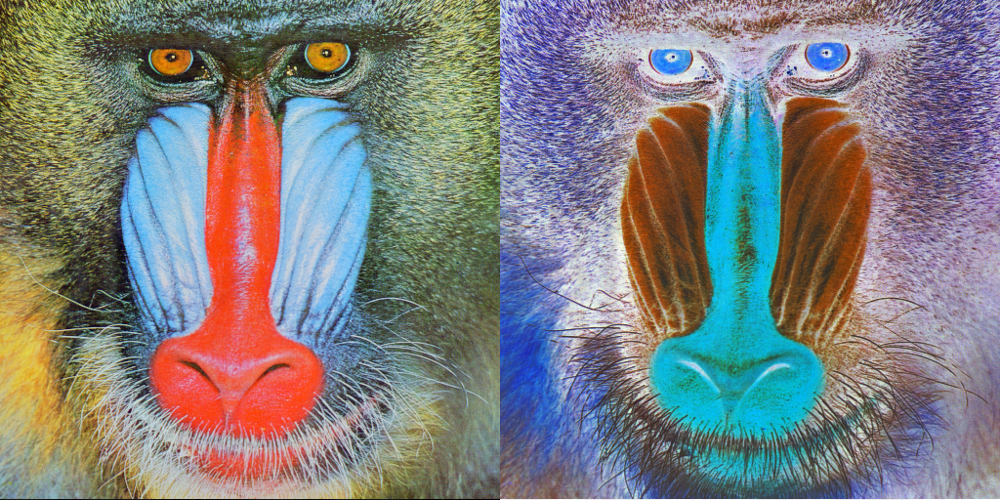

In [ ]:
try:
    brightness = int(input('Masukkan tingkat kecerahan [-255 hingga 255]: '))
    contrast = float(input('Masukkan kontras [1.0 hingga 3.0]: '))
except ValueError:
    print('Error, input bukan angka.')
    exit()

original = cv.imread('/content/drive/MyDrive/PCVK/mandrill.tiff')
if original is None:
    print("Gagal memuat gambar.")
    exit()

new_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            new_image[y, x, c] = np.clip(contrast * original[y, x, c] + brightness, 0, 255)

final_frame = cv.hconcat([original, new_image])

cv2_imshow(final_frame)

2. Implementasikan transformasi contrast pada Google Colaboratory menggunakan
formula yang terdapat pada bagian Ulasan Teori untuk kontras, sehingga
menghasilkan keluaran seperti berikut:

Mengubah kontras dan tingkat kecerahan citra
---------------------------------


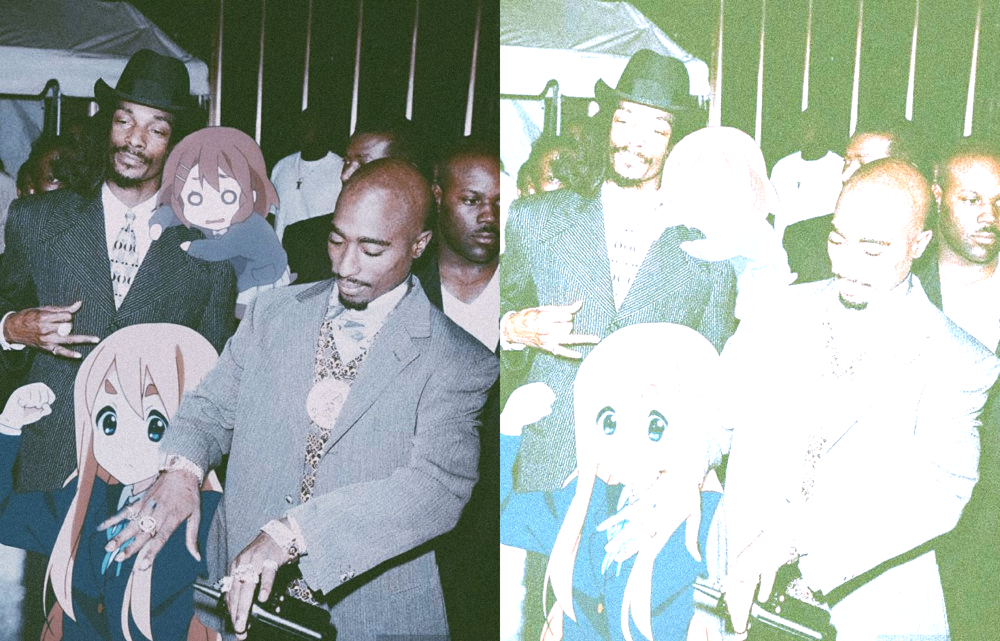

In [ ]:
print('Mengubah kontras dan tingkat kecerahan citra')
print('---------------------------------')

try:
    brightness = int(input('Masukkan tingkat kecerahan [-255 hingga 255]: '))
    contrast = float(input('Masukkan kontras [1.0 hingga 3.0]: '))
except ValueError:
    print('Error, input bukan angka.')
    exit()

original = cv.imread('/content/drive/MyDrive/PCVK/img.jpeg')
if original is None:
    print("Gagal memuat gambar.")
    exit()

new_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            new_image[y, x, c] = np.clip(contrast * original[y, x, c] + brightness, 0, 255)

final_frame = cv.hconcat([original, new_image])

cv2_imshow(final_frame)

3. Implementasikan transformasi logarithmic brightness pada Google Colaboratory
menggunakan formula yang terdapat pada bagian Ulasan Teori untuk transformasi
log, sehingga menghasilkan keluaran seperti berikut:

 mengubah tingkat kecerahan citra dengan transform log 
 -------------------------------- 


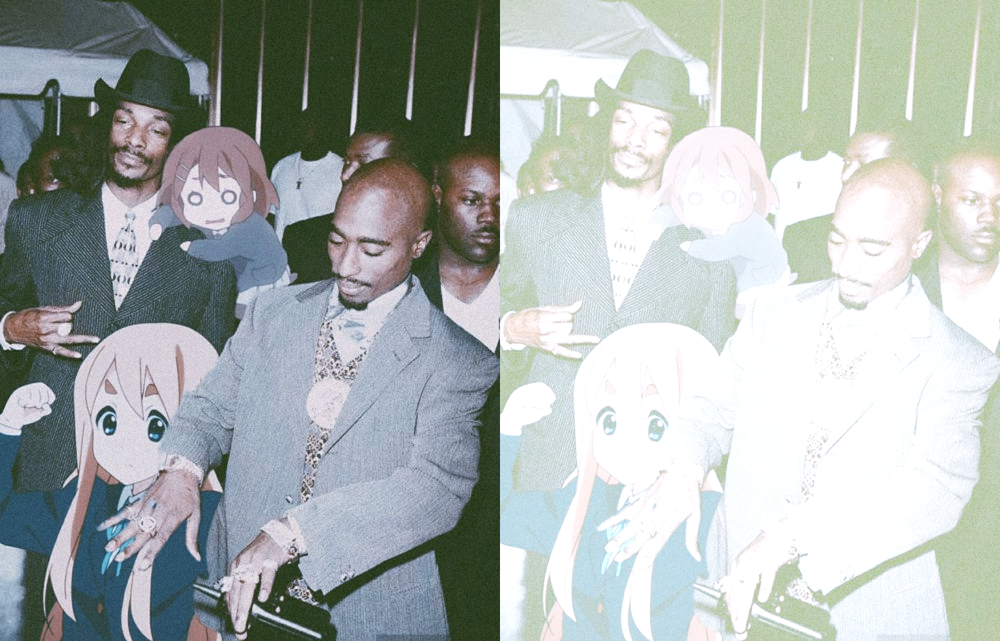

In [ ]:
print(' mengubah tingkat kecerahan citra dengan transform log ')
print(' -------------------------------- ')
original = cv.imread('/content/drive/MyDrive/PCVK/img.jpeg')
try:
    brightness = int(input('Masukan nilai kecerahan: '))
except ValueError:
    print('Error, not a number')

image = original
brightness_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            brightness_image[y,x,c] = np.clip(brightness*(np.log(1.0+original[y,x,c])), 0, 255)

final_frame = cv.hconcat((original, brightness_image))
cv2_imshow(final_frame)

4. Implementasikan transformasi grayscale menggunakan metode averaging, lightness,dan luminance pada Google Colaboratory menggunakan formula yang terdapat pada bagian Ulasan Teori, sehingga menghasilkan keluaran seperti berikut:

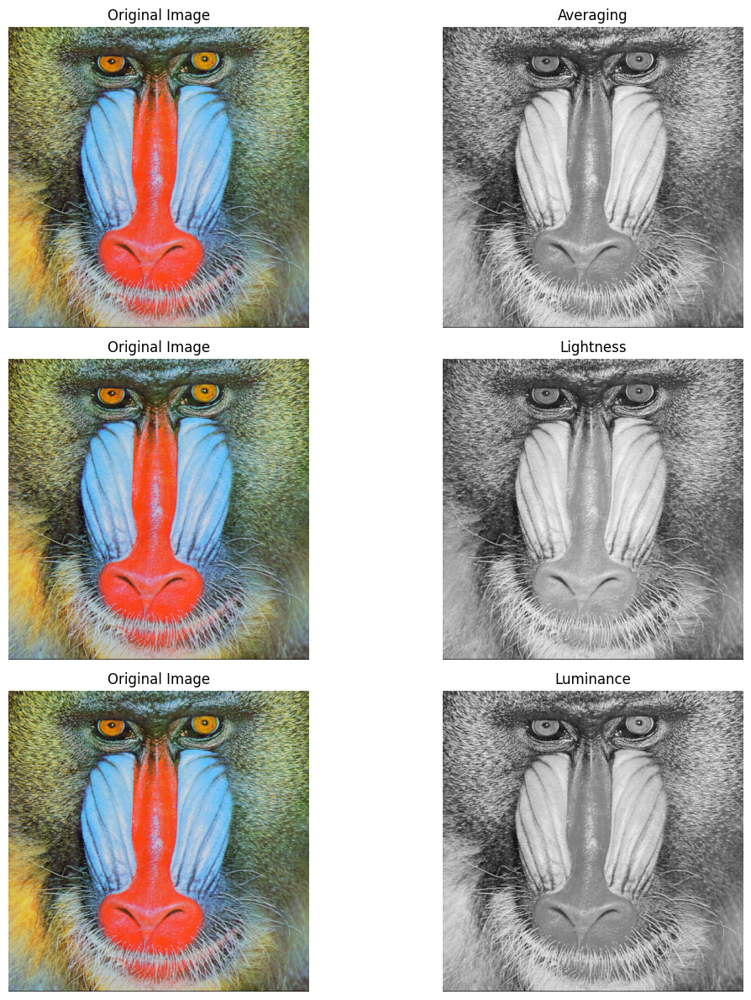

In [18]:
import matplotlib.pyplot as plt

# Load image
image_path = '/content/drive/MyDrive/PCVK/mandrill.tiff'
img = cv.imread(image_path)

# Convert BGR to RGB
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# 1. Averaging Method
gray_avg = np.mean(img_rgb, axis=2)

# 2. Lightness Method
gray_lightness = np.max(img_rgb, axis=2)/2 + np.min(img_rgb, axis=2)/2

# 3. Luminance Method
gray_luminance = 0.2989 * img_rgb[:,:,0] + 0.5870 * img_rgb[:,:,1] + 0.1140 * img_rgb[:,:,2]

# Plot the results
fig, axarr = plt.subplots(3, 2, figsize=(12, 12))

# Averaging
axarr[0, 0].imshow(img_rgb)
axarr[0, 1].imshow(gray_avg, cmap='gray')
axarr[0, 0].set_title("Original Image")
axarr[0, 1].set_title("Averaging")

# Lightness
axarr[1, 0].imshow(img_rgb)
axarr[1, 1].imshow(gray_lightness, cmap='gray')
axarr[1, 0].set_title("Original Image")
axarr[1, 1].set_title("Lightness")

# Luminance
axarr[2, 0].imshow(img_rgb)
axarr[2, 1].imshow(gray_luminance, cmap='gray')
axarr[2, 0].set_title("Original Image")
axarr[2, 1].set_title("Luminance")

# Remove axes for a cleaner look
for ax in axarr.flat:
    ax.axis('off')

plt.tight_layout()
plt.show()


5. Tampilkanlah warna tertentu pada citra, dan ubah warna lain menjadi grayscale. Misal, tampilkan warna biru pada citra masukan dan ubah bagian lain yang tidak berwarna biru menjadi grayscale seperti pada contoh berikut:

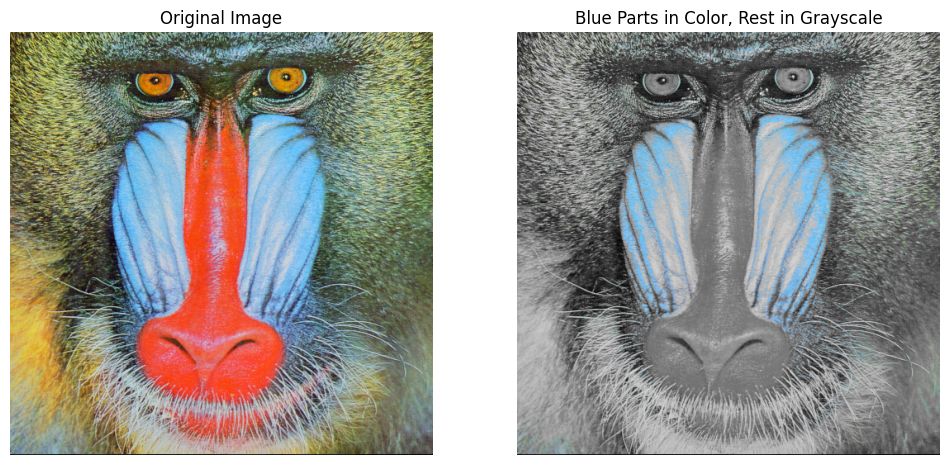

In [22]:
image_path = '/content/drive/MyDrive/PCVK/mandrill.tiff'
img = cv.imread(image_path)

img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

gray_img = cv.cvtColor(img_rgb, cv.COLOR_RGB2GRAY)

gray_img_3ch = cv.cvtColor(gray_img, cv.COLOR_GRAY2RGB)

lower_blue = np.array([100, 150, 0])
upper_blue = np.array([140, 255, 255])

mask = cv.inRange(img_rgb, lower_blue, upper_blue)

mask_inv = cv.bitwise_not(mask)

blue_parts = cv.bitwise_and(img_rgb, img_rgb, mask=mask)

gray_parts = cv.bitwise_and(gray_img_3ch, gray_img_3ch, mask=mask_inv)

result = cv.add(blue_parts, gray_parts)

fig, axarr = plt.subplots(1, 2, figsize=(12, 6))

axarr[0].imshow(img_rgb)
axarr[0].set_title("Original Image")
axarr[0].axis('off')

axarr[1].imshow(result)
axarr[1].set_title("Blue Parts in Color, Rest in Grayscale")
axarr[1].axis('off')

plt.show()
